In [54]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/medseg-covid-dataset-2/rp_lung_msk/rp_lung_msk/6.nii
/kaggle/input/medseg-covid-dataset-2/rp_lung_msk/rp_lung_msk/9.nii
/kaggle/input/medseg-covid-dataset-2/rp_lung_msk/rp_lung_msk/8.nii
/kaggle/input/medseg-covid-dataset-2/rp_lung_msk/rp_lung_msk/7.nii
/kaggle/input/medseg-covid-dataset-2/rp_lung_msk/rp_lung_msk/4.nii
/kaggle/input/medseg-covid-dataset-2/rp_lung_msk/rp_lung_msk/5.nii
/kaggle/input/medseg-covid-dataset-2/rp_lung_msk/rp_lung_msk/3.nii
/kaggle/input/medseg-covid-dataset-2/rp_lung_msk/rp_lung_msk/2.nii
/kaggle/input/medseg-covid-dataset-2/rp_lung_msk/rp_lung_msk/1.nii
/kaggle/input/medseg-covid-dataset-2/rp_msk/rp_msk/6.nii
/kaggle/input/medseg-covid-dataset-2/rp_msk/rp_msk/9.nii
/kaggle/input/medseg-covid-dataset-2/rp_msk/rp_msk/8.nii
/kaggle/input/medseg-covid-dataset-2/rp_msk/rp_msk/7.nii
/kaggle/input/medseg-covid-dataset-2/rp_msk/rp_msk/4.nii
/kaggle/input/medseg-covid-dataset-2/rp_msk/rp_msk/5.nii
/kaggle/input/medseg-covid-dataset-2/rp_msk/rp_msk/3.ni

In [94]:
import pandas as pd
import cv2
import numpy as np
import matplotlib.pyplot as plt
import nibabel as nib
from pylab import rcParams
import random
import glob
import os

# Data Pre-processing

In [95]:
def clahe_enhancer(test_img, demo):

  test_img = test_img*255
  test_img = np.uint8(test_img)
  test_img_flattened = test_img.flatten()
  
  clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
  clahe_image = clahe.apply(test_img)
  clahe_image_flattened = clahe_image.flatten()

  if demo == 1:

    fig = plt.figure()
    rcParams['figure.figsize'] = 10,10
    
    plt.subplot(2, 2, 1)
    plt.imshow(test_img, cmap='bone')
    plt.title("Original CT-Scan")

    plt.subplot(2, 2, 2)
    plt.hist(test_img_flattened)
    plt.title("Histogram of Original CT-Scan")

    plt.subplot(2, 2, 3)
    plt.imshow(clahe_image, cmap='bone')
    plt.title("CLAHE Enhanced CT-Scan")

    plt.subplot(2, 2, 4)
    plt.hist(clahe_image_flattened)
    plt.title("Histogram of CLAHE Enhanced CT-Scan")

  return(clahe_image)

In [96]:
def cropper(test_img, demo):

  test_img = test_img*255
  test_img = np.uint8(test_img)

  # ret, thresh = cv2.threshold(test_img, 50, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU) 
  # ret, thresh = cv2.threshold(test_img, ret, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU) 

  contours,hierarchy = cv2.findContours(test_img, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
  areas = [cv2.contourArea(c) for c in contours]

  x = np.argsort(areas)

  max_index = x[x.size - 1]
  cnt1=contours[max_index]
  second_max_index = x[x.size - 2]
  cnt2 = contours[second_max_index]

  # max_index = np.argmax(areas)
  # cnt=contours[max_index]

  x,y,w,h = cv2.boundingRect(cnt1)
  # print(x,y,w,h)
  p,q,r,s = cv2.boundingRect(cnt2)
  # print(p,q,r,s)

  cropped1 = test_img[y:y+h, x:x+w]
  cropped1 = cv2.resize(cropped1, dsize=(125,250), interpolation=cv2.INTER_AREA)
  cropped2 = test_img[q:q+s, p:p+r]
  cropped2 = cv2.resize(cropped2, dsize=(125,250), interpolation=cv2.INTER_AREA)

  fused = np.concatenate((cropped1, cropped2), axis=1)

  # super_cropped = test_img[y+7:y+h-20, x+25:x+w-25]
  points_lung1 = []
  points_lung2 = []
  
    
  points_lung1.append(x); points_lung1.append(y); points_lung1.append(w); points_lung1.append(h)
  points_lung2.append(p); points_lung2.append(q); points_lung2.append(r); points_lung2.append(s)

  # print(points_lung1)
  # print(points_lung2)
  
  if demo == 1:

    fig = plt.figure()
    rcParams['figure.figsize'] = 35, 35

    plt.subplot(1, 3, 1)
    plt.imshow(test_img, cmap='bone')
    plt.title("Original CT-Scan")

    # plt.subplot(1, 3, 2)
    # plt.imshow(thresh, cmap='bone')
    # plt.title("Binary Mask")

    plt.subplot(1, 3, 3)
    plt.imshow(fused, cmap='bone')
    plt.title("Cropped CT scan after making bounding rectangle")

    # plt.subplot(1, 4, 4)
    # plt.imshow(super_cropped, cmap='bone')
    # plt.title("Cropped further manually")

    plt.show()

  return(fused, points_lung1, points_lung2)

In [97]:
def read_nii_demo(filepath, data):
    ct_scan = nib.load(filepath)
    array   = ct_scan.get_fdata()
    array   = np.rot90(np.array(array))
    slices = array.shape[2]
    array = array[:,:,round(slices*0.2):round(slices*0.8)]
    array = np.reshape(np.rollaxis(array, 2),(array.shape[2],array.shape[0],array.shape[1], 1))

    for img_no in range(0, array.shape[0]):
        # array = Image.resize(array[...,img_no], (img_size,img_size))
        img = cv2.resize(array[img_no], dsize=(img_size, img_size), interpolation=cv2.INTER_AREA)
        xmax, xmin = img.max(), img.min()
        img = (img - xmin)/(xmax - xmin)
        data.append(img)

In [99]:
def read_nii(filepath, data, string):
    global all_points_of_lung1
    global all_points_of_lung2
    ct_scan = nib.load(filepath)
    array   = ct_scan.get_fdata()
    array   = np.rot90(np.array(array))
    slices = array.shape[2]
    array = array[:,:,round(slices*0.2):round(slices*0.8)]
    array = np.reshape(np.rollaxis(array, 2),(array.shape[2],array.shape[0],array.shape[1],1))
    #print(array.shape[2])
    #array = skimage.transform.resize(array, (array.shape[2], img_size, img_size))
    #array = cv2.resize(array, dsize=(img_size, img_size), interpolation=cv2.INTER_CUBIC)

    if string == "lungs":
      all_points_for_lung1 = []
      all_points_for_lung2 = []
        
    for img_no in range(0, array.shape[0]):
        if string == 'lungs' and np.unique(array[img_no]).size == 1:
          continue
        img = cv2.resize(array[img_no], dsize=(img_size, img_size), interpolation=cv2.INTER_AREA)
        xmax, xmin = img.max(), img.min()
        img = (img - xmin)/(xmax - xmin)

        if string == 'lungs':
          # img = np.uint8(img*255) 
          img[img>0]=1
          img, points1, points2 = cropper(img, demo = 0)
          all_points_of_lung1.append((points1[0], points1[1], points1[2], points1[3]))
          all_points_of_lung2.append((points2[0], points2[1], points2[2], points2[3]))
          continue 
            
        if string == "cts" and img_no < len(all_points_of_lung1):
          img = clahe_enhancer(img, demo = 0)
          # img, points1, points2 = cropper(img, demo = 0)
          # all_points_of_lung1.append((points1[0], points1[1], points1[2], points1[3]))
          # all_points_of_lung2.append((points2[0], points2[1], points2[2], points2[3]))   
          a,b,c,d = all_points_of_lung1[img_no]
          e,f,g,h = all_points_of_lung2[img_no]
          img1 = img[b:b+d, a:a+c]
          img1 = cv2.resize(img1, dsize=(125,250), interpolation=cv2.INTER_AREA)
          img2 = img[f:f+h, e:e+g]
          img2 = cv2.resize(img2, dsize=(125,250), interpolation=cv2.INTER_AREA)
          img = np.concatenate((img1, img2), axis=1)    

        if string == "infections" and img_no < len(all_points_of_lung1):
          a,b,c,d = all_points_of_lung1[img_no]
          e,f,g,h = all_points_of_lung2[img_no]
          img = np.uint8(img*255)
          img1 = img[b:b+d, a:a+c]
          img1 = cv2.resize(img1, dsize=(125,250), interpolation=cv2.INTER_AREA)
          img2 = img[f:f+h, e:e+g]
          img2 = cv2.resize(img2, dsize=(125,250), interpolation=cv2.INTER_AREA)
          img = np.concatenate((img1, img2), axis=1)


        # img = cv2.resize(img, dsize=(192, 192), interpolation=cv2.INTER_LINEAR)
        # img = img/255
        #  remember to normalize again
        # also resize images and masks for all
        
        data.append(img)

In [100]:
img_size = 512

In [101]:
all_points_of_lung1 = []
all_points_of_lung2 = []

## For COVID-19-CT-20 dataset

In [102]:
# Read and examine sarscov2-ctscan-dataset metadata
raw_data = pd.read_csv("/kaggle/input/covid19-ct-scans/metadata.csv")
raw_data.head()

,ct_scan,lung_mask,infection_mask,lung_and_infection_mask
0,../input/covid19-ct-scans/ct_scans/coronacases...,../input/covid19-ct-scans/lung_mask/coronacase...,../input/covid19-ct-scans/infection_mask/coron...,../input/covid19-ct-scans/lung_and_infection_m...
1,../input/covid19-ct-scans/ct_scans/coronacases...,../input/covid19-ct-scans/lung_mask/coronacase...,../input/covid19-ct-scans/infection_mask/coron...,../input/covid19-ct-scans/lung_and_infection_m...
2,../input/covid19-ct-scans/ct_scans/coronacases...,../input/covid19-ct-scans/lung_mask/coronacase...,../input/covid19-ct-scans/infection_mask/coron...,../input/covid19-ct-scans/lung_and_infection_m...
3,../input/covid19-ct-scans/ct_scans/coronacases...,../input/covid19-ct-scans/lung_mask/coronacase...,../input/covid19-ct-scans/infection_mask/coron...,../input/covid19-ct-scans/lung_and_infection_m...
4,../input/covid19-ct-scans/ct_scans/coronacases...,../input/covid19-ct-scans/lung_mask/coronacase...,../input/covid19-ct-scans/infection_mask/coron...,../input/covid19-ct-scans/lung_and_infection_m...


In [103]:
raw_data.shape

(20, 4)

In [104]:
cts_1 = []
lungs_1 = []
infections_1 = []

In [105]:
for i in range(0, 20):
    read_nii(raw_data.loc[i,'lung_mask'], lungs_1, 'lungs')
    read_nii(raw_data.loc[i,'ct_scan'], cts_1, 'cts') 
    read_nii(raw_data.loc[i,'infection_mask'], infections_1, 'infections')

/tmp/ipykernel_36/1539260012.py:23: RuntimeWarning: invalid value encountered in divide
  img = (img - xmin)/(xmax - xmin)
/tmp/ipykernel_36/1539260012.py:49: RuntimeWarning: invalid value encountered in cast
  img = np.uint8(img*255)


(250, 250) (250, 250)


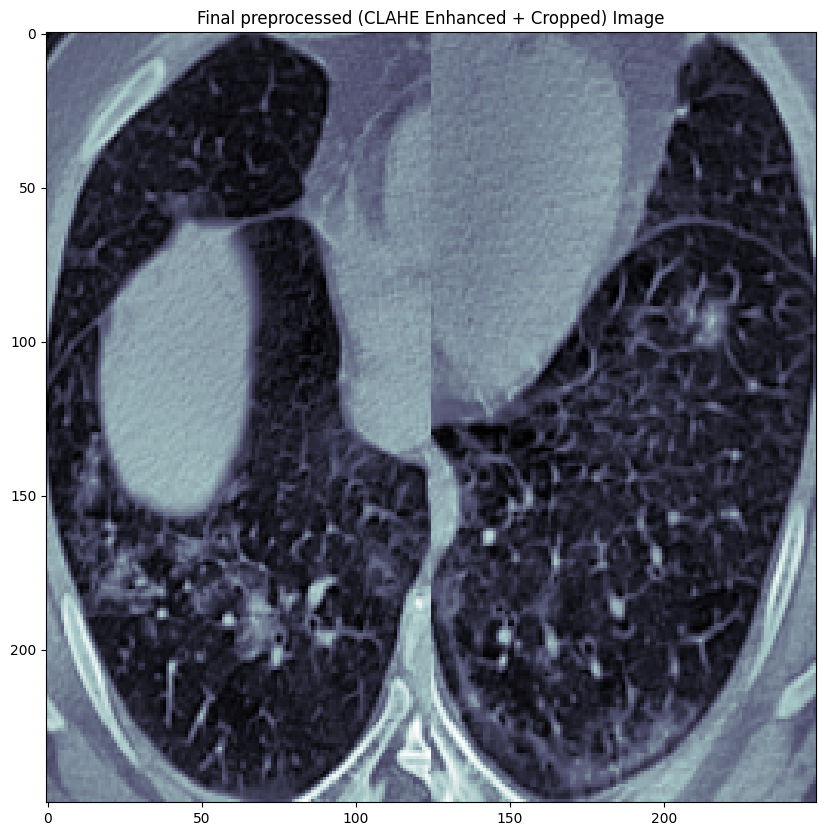

In [106]:
x= 50
plt.imshow(cts_1[x], cmap='bone')
plt.title("Final preprocessed (CLAHE Enhanced + Cropped) Image")
rcParams['figure.figsize'] = 7, 7
print(infections_1[x].shape, cts_1[x].shape)

In [107]:
y_label_1 = []
for i in range(0, len(infections_1)):
  if len(np.unique(infections_1[i]))!=1:
    y_label_1.append(1)
  else:
    y_label_1.append(0)

In [108]:
print(f"Non-Covid-19 cases from dataset1: {y_label_1.count(0)}")
print(f"Covid-19 cases from dataset1: {y_label_1.count(1)}")

Non-Covid-19 cases from dataset1: 691
Covid-19 cases from dataset1: 1421


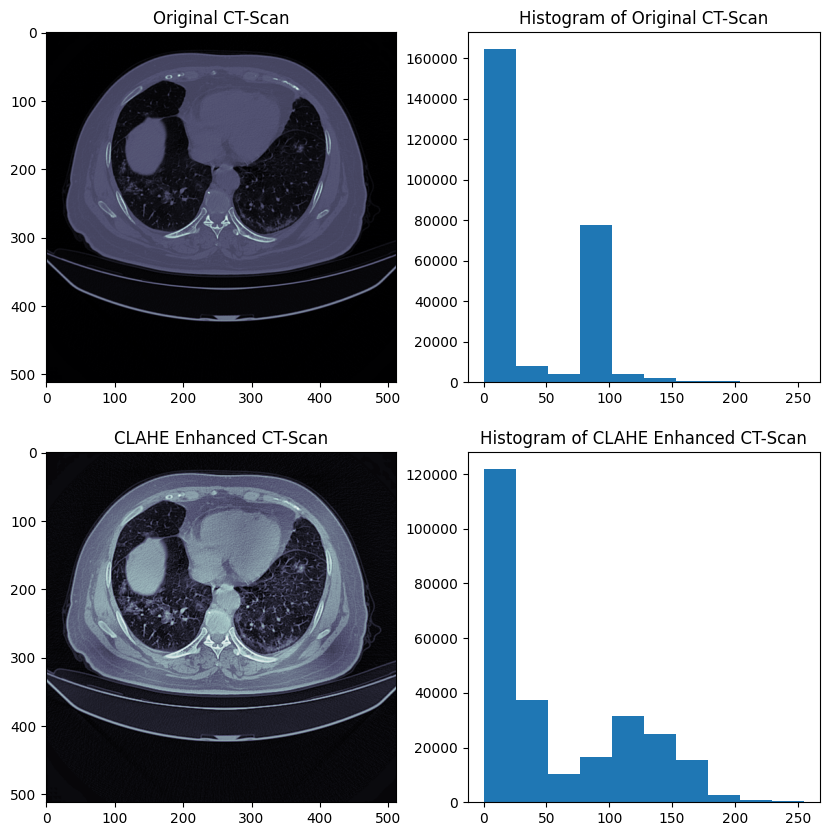

In [109]:
test_file = []
read_nii_demo(raw_data.loc[0,'ct_scan'], test_file)
test_file = np.array(test_file)
rcParams['figure.figsize'] = 10, 10
clahe_image = clahe_enhancer(test_file[50], demo = 1)

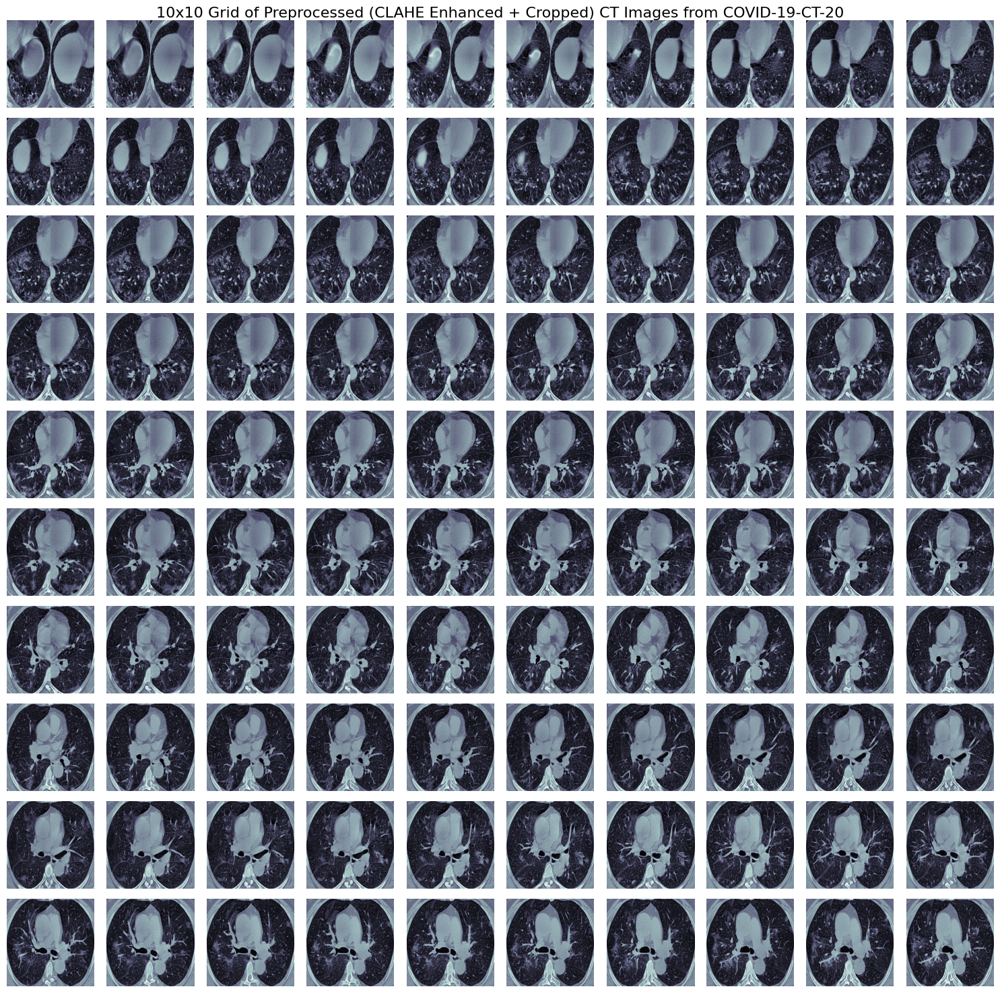

In [110]:
fig, axes = plt.subplots(10, 10, figsize=(15, 15))

for i, ax in enumerate(axes.flat):
    if i < len(cts_1):
        ax.imshow(cts_1[i+40], cmap='bone')
        ax.axis('off')
    else:
        ax.axis('off')

plt.suptitle("10x10 Grid of Preprocessed (CLAHE Enhanced + Cropped) CT Images from COVID-19-CT-20", fontsize=16)
plt.tight_layout()
plt.show()

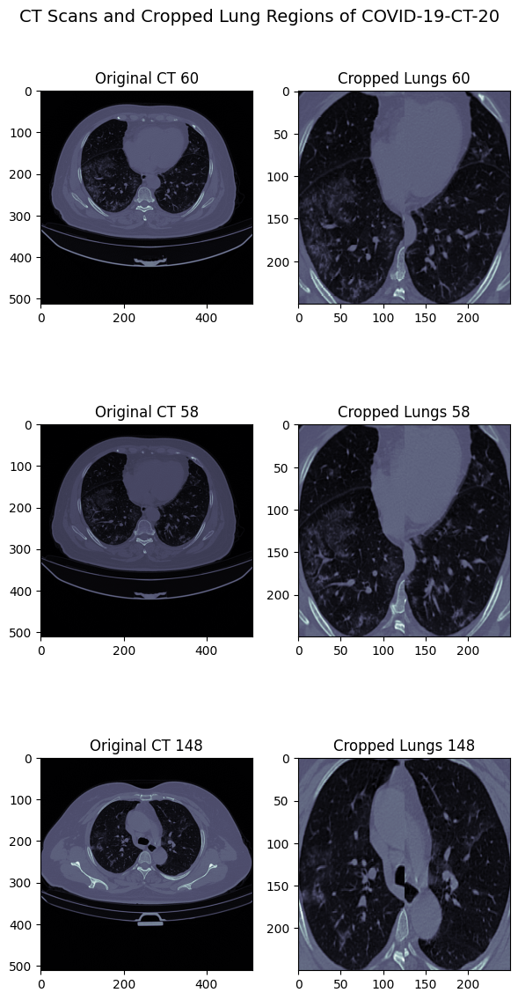

In [111]:
lung_mask_file = []
ct_scan_file = []

read_nii_demo(raw_data.loc[0,'lung_mask'], lung_mask_file)
read_nii_demo(raw_data.loc[0,'ct_scan'], ct_scan_file)

indices = random.sample(range(len(ct_scan_file)), 3)

fig, axes = plt.subplots(3, 2, figsize=(6, 12))
fig.suptitle("CT Scans and Cropped Lung Regions of COVID-19-CT-20", fontsize=14)
for i, idx in enumerate(indices):
    lung_mask = lung_mask_file[idx]
    ct_scan = ct_scan_file[idx]

    lung_mask[lung_mask > 0] = 1
    _, lung1_points, lung2_points = cropper(lung_mask, demo=0)

    a,b,c,d = lung1_points
    e,f,g,h = lung2_points

    img1 = ct_scan[b:b+d, a:a+c]
    img1 = cv2.resize(img1, dsize=(125,250), interpolation=cv2.INTER_AREA)
    img2 = ct_scan[f:f+h, e:e+g]
    img2 = cv2.resize(img2, dsize=(125,250), interpolation=cv2.INTER_AREA)
    cropped = np.concatenate((img1, img2), axis=1)  

    axes[i,0].imshow(ct_scan, cmap='bone')
    axes[i,0].set_title(f"Original CT {idx}")

    axes[i,1].imshow(cropped, cmap='bone')
    axes[i,1].set_title(f"Cropped Lungs {idx}")

plt.tight_layout()
plt.show()


In [112]:
print(len(cts_1) , len(infections_1))

2112 2112


## For COVID-19 CT segmentation dataset

In [138]:
all_points_of_lung1 = []
all_points_of_lung2 = []

In [140]:
cts_2 = []
lungs_2 = []
infections_2 = []

In [141]:
lung_mask_paths = sorted(glob.glob("/kaggle/input/medseg-covid-dataset-2/rp_lung_msk/rp_lung_msk/*.nii"),
                         key=lambda x: int(os.path.basename(x).split('.')[0]))
infection_mask_paths = sorted(glob.glob("/kaggle/input/medseg-covid-dataset-2/rp_msk/rp_msk/*.nii"),
                              key=lambda x: int(os.path.basename(x).split('.')[0]))
ct_scan_paths = sorted(glob.glob("/kaggle/input/medseg-covid-dataset-2/rp_im/rp_im/*.nii"),
                       key=lambda x: int(os.path.basename(x).split('.')[0]))

print(len(lung_mask_paths), len(infection_mask_paths), len(ct_scan_paths))

9 9 9


In [142]:
for i, (lung_path, inf_path, ct_path) in enumerate(zip(lung_mask_paths, infection_mask_paths, ct_scan_paths)):
    print(f"Sample {i}:")
    print(" Lung:", lung_path)
    print(" Infection:", inf_path)
    print(" CT:", ct_path)
    
    read_nii(lung_path, lungs_2, 'lungs')
    read_nii(ct_path, cts_2, 'cts')
    read_nii(inf_path, infections_2, 'infections')

Sample 0:
 Lung: /kaggle/input/medseg-covid-dataset-2/rp_lung_msk/rp_lung_msk/1.nii
 Infection: /kaggle/input/medseg-covid-dataset-2/rp_msk/rp_msk/1.nii
 CT: /kaggle/input/medseg-covid-dataset-2/rp_im/rp_im/1.nii
Sample 1:
 Lung: /kaggle/input/medseg-covid-dataset-2/rp_lung_msk/rp_lung_msk/2.nii
 Infection: /kaggle/input/medseg-covid-dataset-2/rp_msk/rp_msk/2.nii
 CT: /kaggle/input/medseg-covid-dataset-2/rp_im/rp_im/2.nii


/tmp/ipykernel_36/1539260012.py:23: RuntimeWarning: invalid value encountered in divide
  img = (img - xmin)/(xmax - xmin)
/tmp/ipykernel_36/1539260012.py:49: RuntimeWarning: invalid value encountered in cast
  img = np.uint8(img*255)


Sample 2:
 Lung: /kaggle/input/medseg-covid-dataset-2/rp_lung_msk/rp_lung_msk/3.nii
 Infection: /kaggle/input/medseg-covid-dataset-2/rp_msk/rp_msk/3.nii
 CT: /kaggle/input/medseg-covid-dataset-2/rp_im/rp_im/3.nii
Sample 3:
 Lung: /kaggle/input/medseg-covid-dataset-2/rp_lung_msk/rp_lung_msk/4.nii
 Infection: /kaggle/input/medseg-covid-dataset-2/rp_msk/rp_msk/4.nii
 CT: /kaggle/input/medseg-covid-dataset-2/rp_im/rp_im/4.nii
Sample 4:
 Lung: /kaggle/input/medseg-covid-dataset-2/rp_lung_msk/rp_lung_msk/5.nii
 Infection: /kaggle/input/medseg-covid-dataset-2/rp_msk/rp_msk/5.nii
 CT: /kaggle/input/medseg-covid-dataset-2/rp_im/rp_im/5.nii
Sample 5:
 Lung: /kaggle/input/medseg-covid-dataset-2/rp_lung_msk/rp_lung_msk/6.nii
 Infection: /kaggle/input/medseg-covid-dataset-2/rp_msk/rp_msk/6.nii
 CT: /kaggle/input/medseg-covid-dataset-2/rp_im/rp_im/6.nii
Sample 6:
 Lung: /kaggle/input/medseg-covid-dataset-2/rp_lung_msk/rp_lung_msk/7.nii
 Infection: /kaggle/input/medseg-covid-dataset-2/rp_msk/rp_msk/7

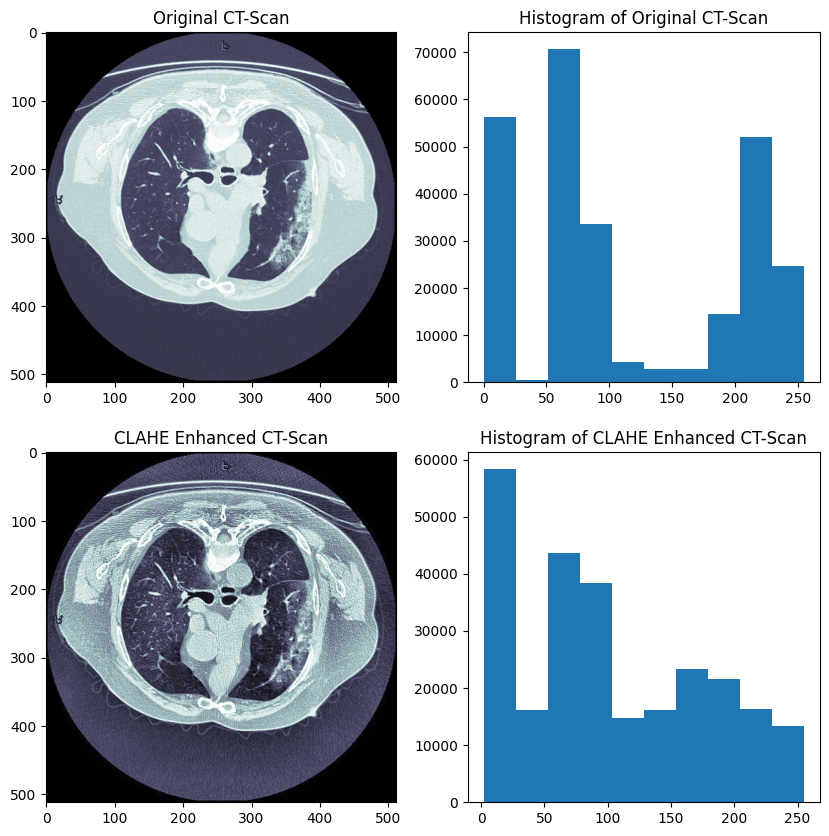

In [143]:
test_file = []
read_nii_demo("/kaggle/input/medseg-covid-dataset-2/rp_im/rp_im/1.nii", test_file)
test_file = np.array(test_file)
rcParams['figure.figsize'] = 10, 10
clahe_image = clahe_enhancer(test_file[8], demo = 1)

(250, 250) (250, 250)


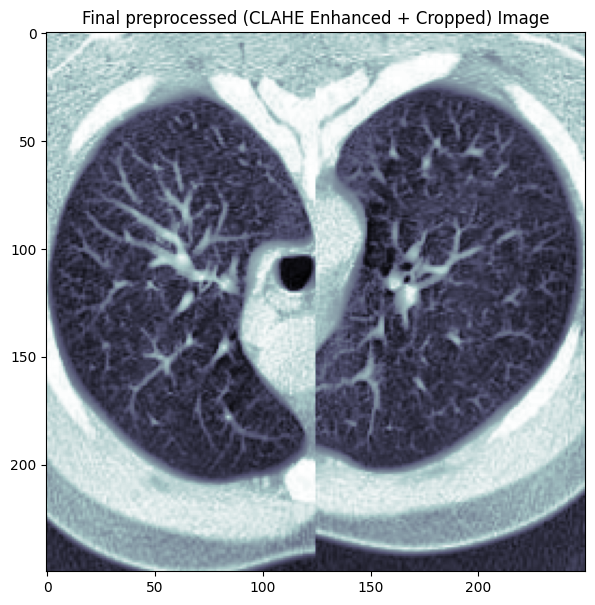

In [147]:
x= 45
plt.imshow(cts_2[x], cmap='bone')
plt.title("Final preprocessed (CLAHE Enhanced + Cropped) Image")
rcParams['figure.figsize'] = 7, 7
print(infections_2[x].shape, cts_2[x].shape)

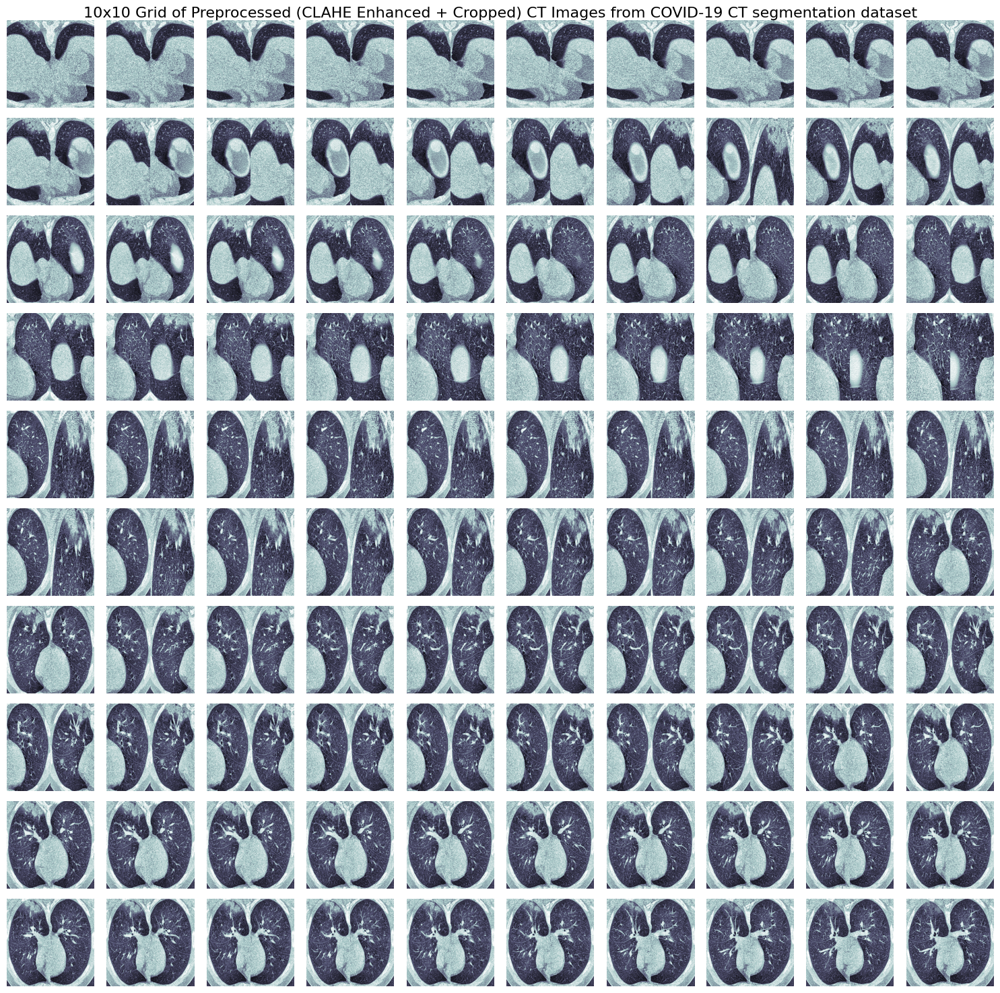

In [149]:
fig, axes = plt.subplots(10, 10, figsize=(15, 15))

for i, ax in enumerate(axes.flat):
    if i < len(cts_2):
        ax.imshow(cts_2[i+60], cmap='bone')
        ax.axis('off')
    else:
        ax.axis('off')

plt.suptitle("10x10 Grid of Preprocessed (CLAHE Enhanced + Cropped) CT Images from COVID-19 CT segmentation dataset", fontsize=16)
plt.tight_layout()
plt.show()

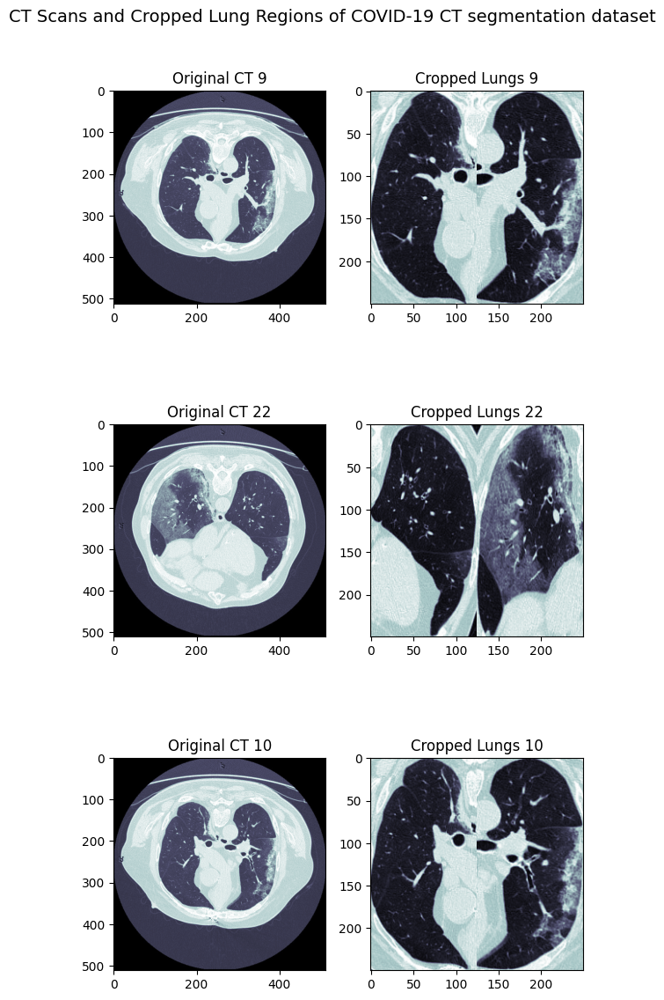

In [151]:
lung_mask_file = []
ct_scan_file = []

read_nii_demo("/kaggle/input/medseg-covid-dataset-2/rp_lung_msk/rp_lung_msk/1.nii", lung_mask_file)
read_nii_demo("/kaggle/input/medseg-covid-dataset-2/rp_im/rp_im/1.nii", ct_scan_file)

indices = random.sample(range(len(ct_scan_file)), 3)

fig, axes = plt.subplots(3, 2, figsize=(6, 12))
fig.suptitle("CT Scans and Cropped Lung Regions of COVID-19 CT segmentation dataset", fontsize=14)
for i, idx in enumerate(indices):
    lung_mask = lung_mask_file[idx]
    ct_scan = ct_scan_file[idx]

    lung_mask[lung_mask > 0] = 1
    _, lung1_points, lung2_points = cropper(lung_mask, demo=0)

    a,b,c,d = lung1_points
    e,f,g,h = lung2_points

    img1 = ct_scan[b:b+d, a:a+c]
    img1 = cv2.resize(img1, dsize=(125,250), interpolation=cv2.INTER_AREA)
    img2 = ct_scan[f:f+h, e:e+g]
    img2 = cv2.resize(img2, dsize=(125,250), interpolation=cv2.INTER_AREA)
    cropped = np.concatenate((img1, img2), axis=1)  

    axes[i,0].imshow(ct_scan, cmap='bone')
    axes[i,0].set_title(f"Original CT {idx}")

    axes[i,1].imshow(cropped, cmap='bone')
    axes[i,1].set_title(f"Cropped Lungs {idx}")

plt.tight_layout()
plt.show()


In [152]:
y_label_2 = []
for i in range(0, len(infections_2)):
  if len(np.unique(infections_2[i]))!=1:
    y_label_2.append(1)
  else:
    y_label_2.append(0)

In [156]:
print(f"Non-Covid-19 cases from dataset2: {y_label_2.count(0)}")
print(f"Covid-19 cases from dataset2: {y_label_2.count(1)}")

Non-Covid-19 cases from dataset2: 194
Covid-19 cases from dataset2: 303


In [157]:
print(len(cts_2) , len(infections_2))

497 497


In [197]:
cts = cts_1 + cts_2
lungs = lungs_1 + lungs_2
infections = infections_1 + infections_2

In [198]:
y_label = y_label_1 + y_label_2

In [199]:
dim1 = []
dim2 = []

for i in range(0, len(cts)):
    dim1.append(cts[i].shape[0])
    dim2.append(cts[i].shape[1])

dim1 = np.array(dim1)
dim2 = np.array(dim2)

In [200]:
np.unique(dim2)

array([250])

In [201]:
new_dim = 224

In [202]:
for i in range(0,len(cts)):
  cts[i] = cv2.resize(cts[i], dsize=(new_dim, new_dim), interpolation=cv2.INTER_LINEAR)

In [203]:
cts = np.array(cts)
cts = cts.reshape(len(cts), new_dim,new_dim,1)
y_label = np.array(y_label)
print(cts.shape, y_label.shape)

(2609, 224, 224, 1) (2609,)


In [204]:
np.save("cts.npy", cts)
np.save("y_label.npy", y_label)

In [205]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve, auc
import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Conv2D, BatchNormalization, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint
from sklearn.utils.class_weight import compute_class_weight
import seaborn as sns

In [206]:
cts = cts/255

In [207]:
x_train, x_valid, y_train, y_valid = train_test_split(
    cts, 
    y_label, 
    test_size=0.3, 
    random_state=42, 
    stratify=y_label
)

In [208]:
np.unique(y_label, return_counts=True)

(array([0, 1]), array([ 885, 1724]))

In [209]:
np.unique(y_train, return_counts=True)

(array([0, 1]), array([ 619, 1207]))

In [210]:
np.unique(y_valid, return_counts=True)

(array([0, 1]), array([266, 517]))

In [211]:
print(x_train.shape, x_valid.shape)
print(y_train.shape, y_valid.shape)

(1826, 224, 224, 1) (783, 224, 224, 1)
(1826,) (783,)


In [212]:
class F1Score(tf.keras.metrics.Metric):
    def __init__(self, name="f1", threshold=0.5, **kwargs):
        super().__init__(name=name, **kwargs)
        self.threshold = threshold
        self.tp = self.add_weight(name="tp", initializer="zeros")
        self.fp = self.add_weight(name="fp", initializer="zeros")
        self.fn = self.add_weight(name="fn", initializer="zeros")

    def update_state(self, y_true, y_pred, sample_weight=None):
        y_true = tf.cast(y_true, tf.float32)
        y_pred = tf.cast(y_pred >= self.threshold, tf.float32)
        tp = tf.reduce_sum(y_true * y_pred)
        fp = tf.reduce_sum((1 - y_true) * y_pred)
        fn = tf.reduce_sum(y_true * (1 - y_pred))
        self.tp.assign_add(tp)
        self.fp.assign_add(fp)
        self.fn.assign_add(fn)

    def result(self):
        precision = self.tp / (self.tp + self.fp + tf.keras.backend.epsilon())
        recall = self.tp / (self.tp + self.fn + tf.keras.backend.epsilon())
        return 2.0 * precision * recall / (precision + recall + tf.keras.backend.epsilon())

    def reset_states(self):
        for v in (self.tp, self.fp, self.fn):
            v.assign(0.0)

In [214]:
model = Sequential()
model.add(Conv2D(16, (3, 3), activation='relu', padding="same", kernel_initializer="he_normal",
                 input_shape=(new_dim, new_dim, 1)))
model.add(BatchNormalization())

model.add(Conv2D(16, (3, 3), padding="same", activation='relu', kernel_initializer="he_normal"))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(32, (3, 3), activation='relu', padding="same", kernel_initializer="he_normal"))
model.add(BatchNormalization())

model.add(Conv2D(32, (3, 3), padding="same", activation='relu', kernel_initializer="he_normal"))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(64, (3, 3), activation='relu', padding="same", kernel_initializer="he_normal"))
model.add(BatchNormalization())

model.add(Conv2D(64, (3, 3), padding="same", activation='relu', kernel_initializer="he_normal"))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))

# If you want these extra blocks, just uncomment:
# model.add(Conv2D(96, (3, 3), dilation_rate=(2, 2), activation='relu', padding="same"))
# model.add(Conv2D(96, (3, 3), padding="valid", activation='relu'))
# model.add(MaxPooling2D(pool_size=(2, 2)))
# model.add(Conv2D(128, (3, 3), dilation_rate=(2, 2), activation='relu', padding="same"))
# model.add(Conv2D(128, (3, 3), padding="valid", activation='relu'))
# model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Flatten())
model.add(Dense(32, activation='relu'))

model.add(Dropout(0.4))
model.add(Dense(1, activation='sigmoid'))

print(model.summary())


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_12 (Conv2D)              │ (None, 224, 224, 16)   │           160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_12          │ (None, 224, 224, 16)   │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_13 (Conv2D)              │ (None, 224, 224, 16)   │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_13          │ (None, 224, 224, 16)   │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 112, 112, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_14 (Conv2D)              │ (None, 112, 112, 32)   │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_14          │ (None, 112, 112, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_15 (Conv2D)              │ (None, 112, 112, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_15          │ (None, 112, 112, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 56, 56, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_16 (Conv2D)              │ (None, 56, 56, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_16          │ (None, 56, 56, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_17 (Conv2D)              │ (None, 56, 56, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_17          │ (None, 56, 56, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 28, 28, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 50176)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 32)             │     1,605,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,678,385 (6.40 MB)

 Trainable params: 1,677,937 (6.40 MB)

 Non-trainable params: 448 (1.75 KB)

None


In [215]:
classes = np.unique(y_train)
weights_arr = compute_class_weight(class_weight="balanced", classes=classes, y=y_train)
class_weights = {int(c): float(w) for c, w in zip(classes, weights_arr)}
print("class_weights:", class_weights)

class_weights: {0: 1.4749596122778674, 1: 0.7564208782104391}


In [216]:
ckpt_loss = ModelCheckpoint(
    "covid_weights_val_loss.weights.h5", monitor="val_loss",
    save_best_only=True, mode="min", verbose=1, save_weights_only=True
)

In [217]:
ckpt_auc = ModelCheckpoint(
    "best_val_auc_weights.weights.h5", monitor="val_auc",
    save_best_only=True, mode="max", verbose=1, save_weights_only=True
)

In [218]:
model.compile(
    loss="binary_crossentropy",
    optimizer=Adam(learning_rate=5e-4),
    metrics=[
        tf.keras.metrics.Precision(name="precision"),
        tf.keras.metrics.Recall(name="recall"),
        F1Score(name="f1"),
        tf.keras.metrics.AUC(name="auc", curve="ROC")
    ],
)

In [219]:
history = model.fit(
    x_train, y_train,
    batch_size=32,
    epochs=25,
    validation_data=(x_valid, y_valid),
    callbacks=[ckpt_loss, ckpt_auc],
    class_weight=class_weights
)

Epoch 1/25


I0000 00:00:1756236788.947788     192 service.cc:148] XLA service 0x7e14080220e0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1756236788.949071     192 service.cc:156]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1756236788.949103     192 service.cc:156]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1756236789.860521     192 cuda_dnn.cc:529] Loaded cuDNN version 90300


 1/58 ━━━━━━━━━━━━━━━━━━━━ 17:41 19s/step - auc: 0.4765 - f1: 0.5674 - loss: 1.1596 - precision: 0.4783 - recall: 0.7333

I0000 00:00:1756236799.930385     192 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - auc: 0.5615 - f1: 0.5077 - loss: 2.3563 - precision: 0.6867 - recall: 0.4721
Epoch 1: val_loss improved from inf to 1.29062, saving model to covid_weights_val_loss.weights.h5

Epoch 1: val_auc improved from -inf to 0.49632, saving model to best_val_auc_weights.weights.h5
58/58 ━━━━━━━━━━━━━━━━━━━━ 33s 248ms/step - auc: 0.5620 - f1: 0.5095 - loss: 2.3371 - precision: 0.6869 - recall: 0.4749 - val_auc: 0.4963 - val_f1: 0.1077 - val_loss: 1.2906 - val_precision: 0.6304 - val_recall: 0.0561
Epoch 2/25
57/58 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - auc: 0.6391 - f1: 0.7550 - loss: 0.6138 - precision: 0.7391 - recall: 0.9505
Epoch 2: val_loss improved from 1.29062 to 1.13379, saving model to covid_weights_val_loss.weights.h5

Epoch 2: val_auc improved from 0.49632 to 0.68688, saving model to best_val_auc_weights.weights.h5
58/58 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - auc: 0.6388 - f1: 0.7548 - loss: 0.6139 - precision: 0.7387 - recall: 0.9507 - val_auc: 0.6

In [220]:
model.load_weights('/kaggle/working/best_val_auc_weights.weights.h5')

In [221]:
score = model.evaluate(x_valid, y_valid, batch_size=32)
print("test loss:" , score[0], "\ntest f1 score:" , score[1])

25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - auc: 0.9320 - f1: 0.6520 - loss: 0.4084 - precision: 0.9261 - recall: 0.9374
test loss: 0.42875751852989197 
test f1 score: 0.9379844665527344


In [222]:
y_pred_prob = model.predict(x_valid, batch_size=32)
y_pred = (y_pred_prob > 0.5).astype(int) 

25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step


In [223]:
print("Classification Report:")
print(classification_report(y_valid, y_pred, digits=4))

Classification Report:
              precision    recall  f1-score   support

           0     0.8764    0.8797    0.8780       266
           1     0.9380    0.9362    0.9371       517

    accuracy                         0.9170       783
   macro avg     0.9072    0.9079    0.9076       783
weighted avg     0.9171    0.9170    0.9170       783



In [224]:
print("Confusion Matrix:")
print(confusion_matrix(y_valid, y_pred))

Confusion Matrix:
[[234  32]
 [ 33 484]]


In [225]:
auc_score = roc_auc_score(y_valid, y_pred_prob)
print(f"ROC-AUC: {auc_score:.4f}")

ROC-AUC: 0.9414


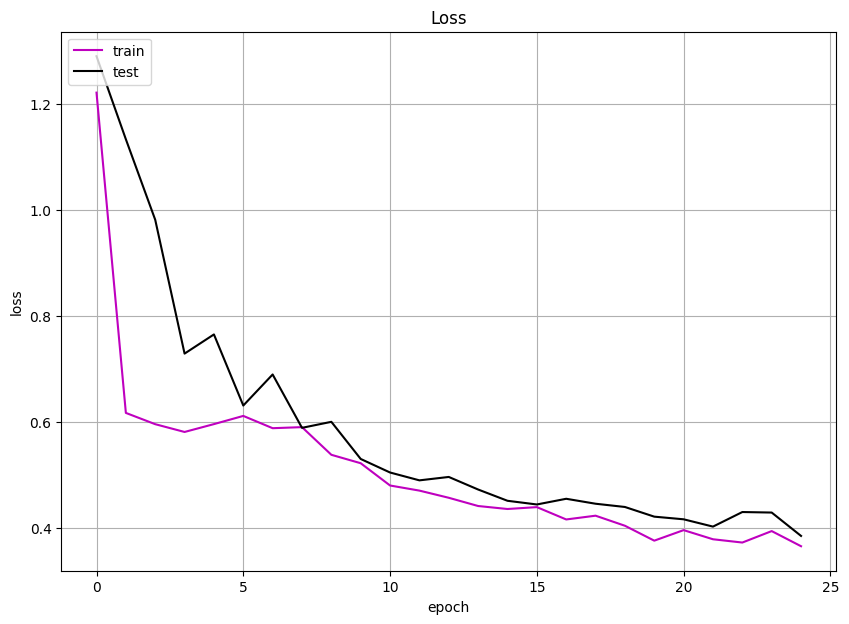

In [226]:
rcParams['figure.figsize'] = 10,7
plt.grid('True')
plt.plot(history.history['loss'], color='m')
plt.plot(history.history['val_loss'], color='k')
plt.title('Loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [227]:
predictions = model.predict(x_valid).flatten()

25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


In [228]:
fpr, tpr, thresholds = roc_curve(y_valid, predictions)
roc_auc = auc(fpr, tpr)

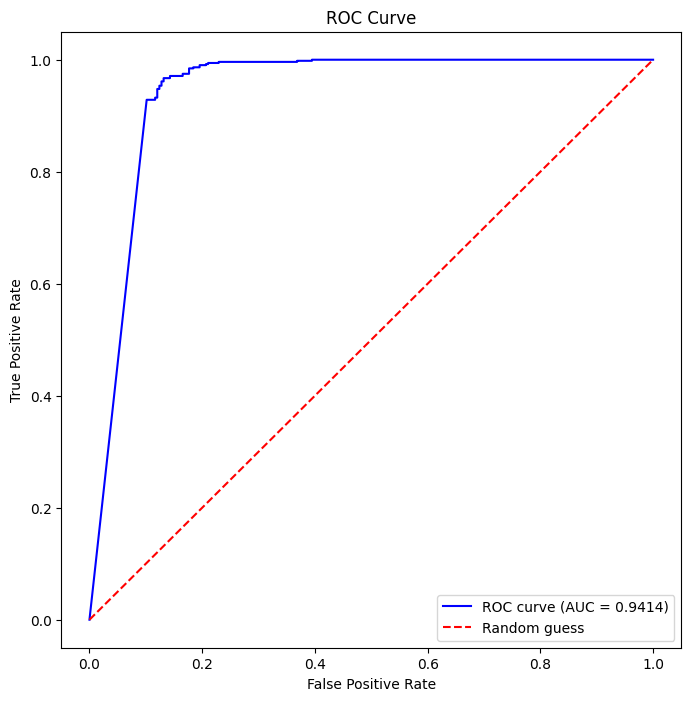

ROC-AUC: 0.9413548377714112


In [229]:
plt.figure(figsize=(8,8))
plt.plot(fpr, tpr, color='blue', label=f'ROC curve (AUC = {roc_auc:.4f})')
plt.plot([0,1], [0,1], color='red', linestyle='--', label="Random guess")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend(loc="lower right")
plt.show()

print("ROC-AUC:", roc_auc)

In [230]:
predictions = model.predict(x_valid).flatten()

# convert to binary labels using threshold 0.5
y_pred = (predictions >= 0.5).astype(int)

25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


In [231]:
types = []
for true, pred in zip(y_valid, y_pred):
    if true == 1 and pred == 1:
        types.append("TP")
    elif true == 0 and pred == 0:
        types.append("TN")
    elif true == 1 and pred == 0:
        types.append("FN")
    elif true == 0 and pred == 1:
        types.append("FP")

In [232]:
df = pd.DataFrame({
    "class": y_valid,
    "pred": predictions,
    "type": types
})

def plot_violin_dist(threshold):
    plt.figure(figsize=(8,6))
    sns.violinplot(x="class", y="pred", data=df, inner=None, color="0.8")
    sns.stripplot(x="class", y="pred", data=df, hue="type", 
                  palette={"TP":"red","TN":"green","FP":"black","FN":"purple"},
                  size=6, jitter=True, dodge=False)
    
    plt.axhline(y=threshold, color="red", linestyle="--", label=f"threshold = {threshold}")
    plt.title(f"Threshold at {threshold}")
    plt.ylabel("Predicted probability")
    plt.xlabel("True class")
    plt.legend(loc="upper left")
    plt.show()

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


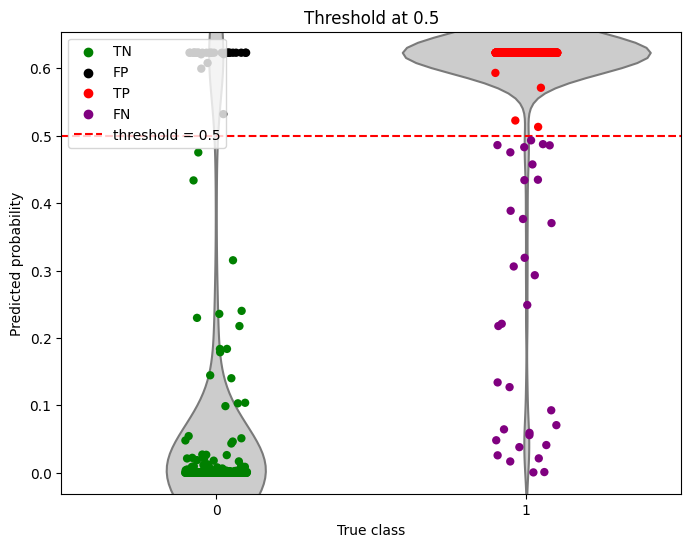

In [233]:
plot_violin_dist(0.5)

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


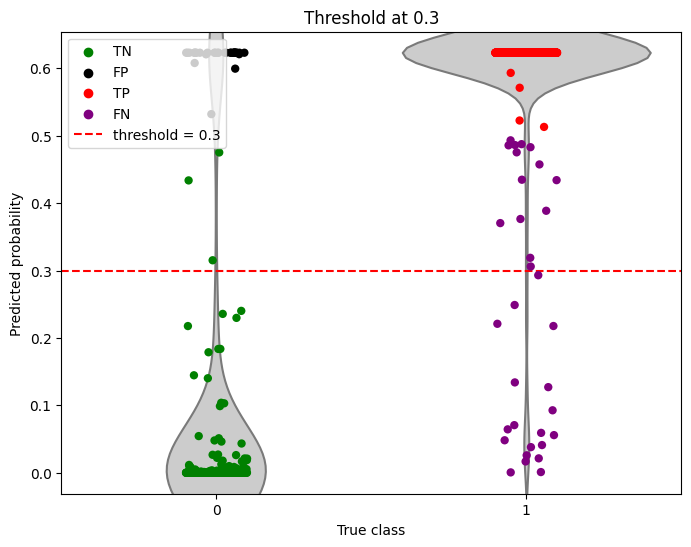

In [235]:
plot_violin_dist(0.3)

In [237]:
new_predictions = model.predict(x_valid).flatten()

new_pred = (new_predictions >= 0.3).astype(int)

25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


In [238]:
fpr, tpr, thresholds = roc_curve(y_valid, new_pred)
roc_auc = auc(fpr, tpr)

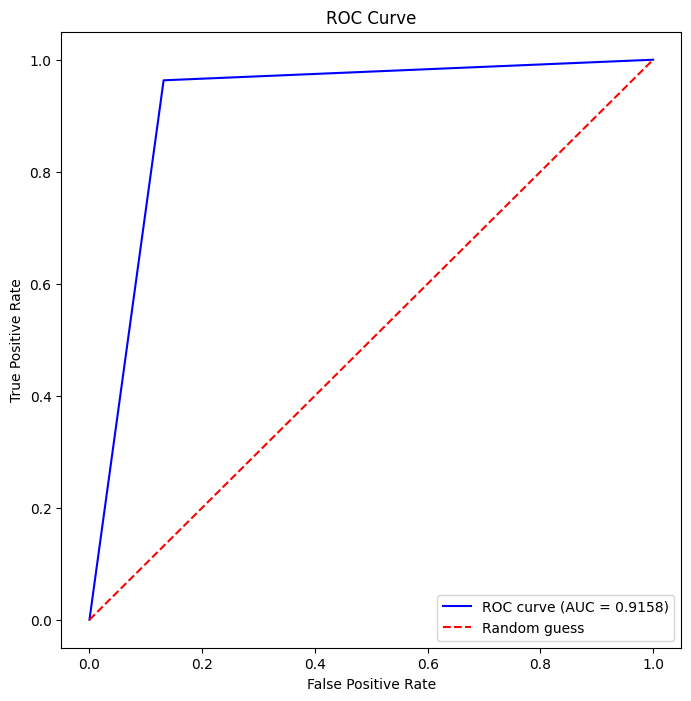

ROC-AUC: 0.9158352845362924


In [239]:
plt.figure(figsize=(8,8))
plt.plot(fpr, tpr, color='blue', label=f'ROC curve (AUC = {roc_auc:.4f})')
plt.plot([0,1], [0,1], color='red', linestyle='--', label="Random guess")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend(loc="lower right")
plt.show()

print("ROC-AUC:", roc_auc)

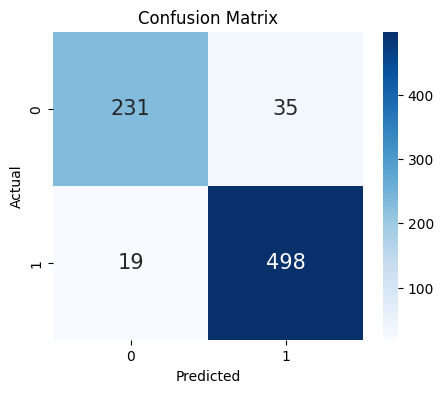

In [240]:
cm = confusion_matrix(y_valid, new_pred)
plt.figure(figsize=(5,4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', annot_kws={"size": 15})
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

In [241]:
print("Classification Report:")
print(classification_report(y_valid, new_pred, digits=4))

Classification Report:
              precision    recall  f1-score   support

           0     0.9240    0.8684    0.8953       266
           1     0.9343    0.9632    0.9486       517

    accuracy                         0.9310       783
   macro avg     0.9292    0.9158    0.9220       783
weighted avg     0.9308    0.9310    0.9305       783

